# Data


In [1]:
import pandas as pd
import numpy as np

pd.options.plotting.backend = "plotly"

In [2]:
df = pd.read_csv('data/stock-prices.csv', index_col='date', parse_dates=True)

In [3]:
from cvx.simulator.interpolation import valid
from cvx.simulator.builder import builder

In [4]:
df.apply(valid)

GOOG    True
AAPL    True
FB      True
BABA    True
AMZN    True
GE      True
AMD     True
WMT     True
BAC     True
GM      True
T       True
UAA     True
SHLD    True
XOM     True
RRC     True
BBY     True
MA      True
PFE     True
JPM     True
SBUX    True
dtype: bool

In [5]:
df.apply(lambda ts: pd.Series({"first": ts.first_valid_index(), "last": ts.last_valid_index()})).transpose()

,first,last
GOOG,2004-08-19,2018-04-11
AAPL,1989-12-29,2018-04-11
FB,2012-05-18,2018-04-11
BABA,2014-09-19,2018-04-11
AMZN,1997-05-15,2018-04-11
GE,1989-12-29,2018-04-11
AMD,1989-12-29,2018-04-11
WMT,1989-12-29,2018-04-11
BAC,1989-12-29,2018-04-11
GM,2010-11-18,2018-04-11


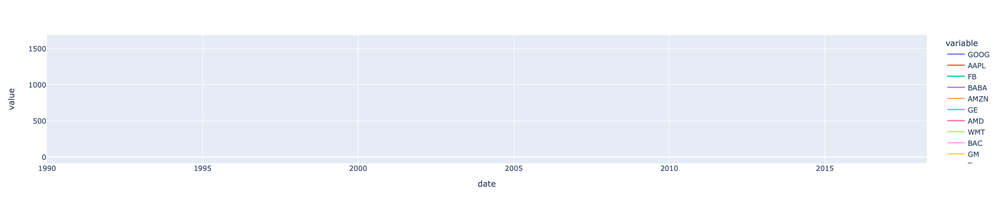

In [6]:
df.plot()

In [14]:
b = builder(prices=df, initial_cash=1e6)

for t, state in b:
    n = len(state.assets)
    assert n <= 20
    # compute the weights
    w = np.random.rand(n)
    w = w / np.sum(w)
    b.set_weights(t[-1], weights=w)

In [15]:
portfolio = b.build()

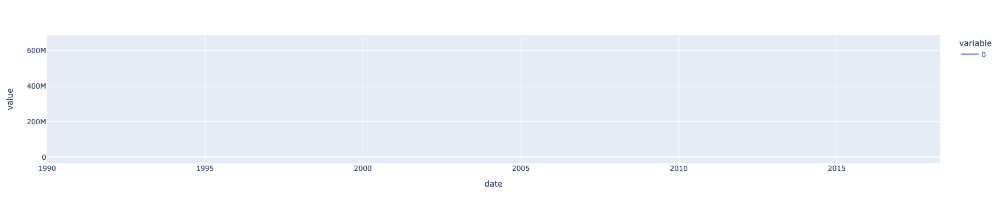

In [16]:
portfolio.nav.plot()

In [17]:
portfolio.metrics()

                    Strategy
------------------  ----------
Start Period        1990-01-02
End Period          2018-04-11
Risk-Free Rate      0.0%
Time in Market      100.0%

Cumulative Return   60,483.37%
CAGR﹪              16.92%

Sharpe              1.14
Prob. Sharpe Ratio  100.0%
Sortino             1.71
Sortino/√2          1.21
Omega               1.23

Max Drawdown        -50.77%
Longest DD Days     1107

Gain/Pain Ratio     0.23
Gain/Pain (1M)      1.58

Payoff Ratio        1.04
Profit Factor       1.23
Common Sense Ratio  1.36
CPC Index           0.69
Tail Ratio          1.11
Outlier Win Ratio   4.01
Outlier Loss Ratio  3.64

MTD                 0.68%
3M                  -4.78%
6M                  -1.35%
YTD                 -0.87%
1Y                  0.75%
3Y (ann.)           4.99%
5Y (ann.)           7.3%
10Y (ann.)          7.98%
All-time (ann.)     16.92%

Avg. Drawdown       -2.54%
Avg. Drawdown Days  21
Recovery Factor     13.97
Ulcer Index         0.11
Serenity Index     

,GOOG,AAPL,FB,BABA,AMZN,GE,AMD,WMT,BAC,GM,T,UAA,SHLD,XOM,RRC,BBY,MA,PFE,JPM,SBUX
date,,,,,,,,,,,,,,,,,,,,
1989-12-29,NaN,0.111186,NaN,NaN,NaN,0.148473,0.152788,0.194144,0.044592,NaN,0.062492,NaN,NaN,0.057661,NaN,0.118133,NaN,0.084712,0.025820,NaN
1990-01-02,NaN,0.157617,NaN,NaN,NaN,0.135273,0.168353,0.078726,0.083090,NaN,0.144147,NaN,NaN,0.007011,NaN,0.022213,NaN,0.151005,0.089139,NaN
1990-01-03,NaN,0.145062,NaN,NaN,NaN,0.070883,0.153142,0.134172,0.093188,NaN,0.099436,NaN,NaN,0.139505,NaN,0.095680,NaN,0.018150,0.087320,NaN
1990-01-04,NaN,0.118229,NaN,NaN,NaN,0.094461,0.121043,0.036696,0.195595,NaN,0.065676,NaN,NaN,0.034036,NaN,0.136362,NaN,0.053356,0.175601,NaN
1990-01-05,NaN,0.180910,NaN,NaN,NaN,0.000630,0.013137,0.091191,0.023535,NaN,0.176311,NaN,NaN,0.172447,NaN,0.186873,NaN,0.010715,0.163228,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-04-05,48.326255,30.976018,46.230737,41.274412,7.383327,19.063999,32.788605,25.543323,14.211589,53.198075,39.460883,1.449561,31.520590,31.091461,57.827754,42.088707,25.874755,47.595131,31.739577,53.981859
2018-04-06,71.399025,29.445267,12.057188,9.638238,1.786817,41.071274,47.215622,11.678220,53.136066,50.565539,55.608197,24.031368,61.197183,37.822455,7.953087,9.181719,68.689051,30.340707,19.069978,24.646648
2018-04-09,17.713804,2.584092,10.318072,13.966546,56.986297,70.466418,37.292042,28.490946,10.833832,54.435122,39.453485,29.922643,42.574916,62.191791,25.352744,13.241198,67.247326,31.519159,41.961415,9.609947


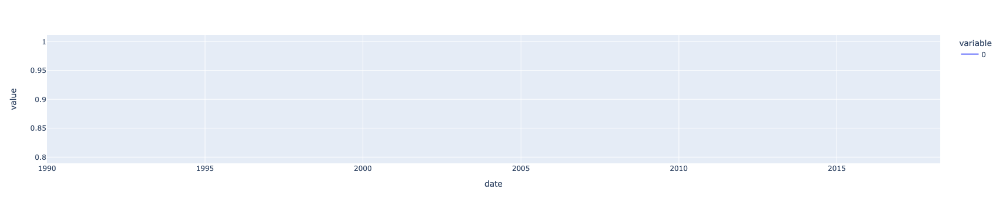

In [18]:
portfolio.weights.sum(axis=1).plot()

In [19]:
??portfolio.weights

Type:        property
String form: <property object at 0x16c279e90>
Source:     
# portfolio.weights.fget
@property
def weights(self) -> pd.DataFrame:
    """A property that returns a pandas dataframe representing
    the weights of various assets in the portfolio.

    Returns: pd.DataFrame: A pandas dataframe representing the weights
    of various assets in the portfolio.

    Notes: The function calculates the weights of various assets
    in the portfolio by dividing the equity positions
    for each asset (as represented in the equity dataframe)
    by the total portfolio value (as represented in the nav dataframe).
    Both dataframes are assumed to have the same dimensions.
    The resulting dataframe will show the relative weight
    of each asset in the portfolio at each point in time."""
    return self.equity.apply(lambda x: x / self.nav)